Execute below code **ONLY ONCE!!!**

In [ ]:
!pip uninstall -y opencv-python opencv-python-headless opencv-contrib-python
# Install dependencies
!apt-get update
!apt-get install -y cmake g++ wget unzip

# Download OpenCV and OpenCV Contrib (if you want extra modules)
!wget -q -O opencv.zip https://github.com/opencv/opencv/archive/4.x.zip
!unzip -q opencv.zip
!mkdir -p opencv-4.x/build
!mkdir -p /content/custom_cv2
%cd opencv-4.x/build
# Configure with specific modules and optimized settings
!cmake -D CMAKE_BUILD_TYPE=Debug \
    -D CMAKE_INSTALL_PREFIX=/usr/local \
    -D INSTALL_PYTHON_EXAMPLES=OFF \
    -D INSTALL_C_EXAMPLES=OFF \
    -D BUILD_EXAMPLES=OFF \
    -D BUILD_TESTS=OFF \
    -D BUILD_PERF_TESTS=OFF \
    -D BUILD_DOCS=OFF \
    -D BUILD_opencv_python3=ON \
    -D PYTHON_DEFAULT_EXECUTABLE=$(which python3) \
    -D BUILD_opencv_features2d=ON \
    -D BUILD_opencv_calib3d=ON \
    -D BUILD_opencv_imgproc=ON \
    -D BUILD_opencv_core=ON \
    -D BUILD_opencv_imgcodecs=ON \
    -D BUILD_opencv_highgui=ON \
    -D BUILD_opencv_videoio=OFF \
    -D BUILD_opencv_objdetect=OFF \
    -D BUILD_opencv_photo=OFF \
    -D BUILD_opencv_flann=ON \
    -D BUILD_opencv_ml=OFF \
    -D BUILD_opencv_gapi=OFF \
    -D BUILD_opencv_video=OFF \
    -D OPENCV_ENABLE_NONFREE=ON \
    -D OPENCV_GENERATE_PKGCONFIG=ON \
    -D WITH_PROTOBUF=OFF \
    -D BUILD_PROTOBUF=OFF \
    -D WITH_GSTREAMER=OFF \
    -D WITH_FFMPEG=OFF \
    -D WITH_OPENCL=OFF \
    -D WITH_CUDA=OFF \
    -D WITH_GTK=OFF \
    -D WITH_QT=OFF \
    -D WITH_DEBUG=ON \
    ..

Found existing installation: opencv-python 4.10.0.84
Uninstalling opencv-python-4.10.0.84:
  Successfully uninstalled opencv-python-4.10.0.84
Found existing installation: opencv-python-headless 4.10.0.84
Uninstalling opencv-python-headless-4.10.0.84:
  Successfully uninstalled opencv-python-headless-4.10.0.84
Found existing installation: opencv-contrib-python 4.10.0.84
Uninstalling opencv-contrib-python-4.10.0.84:
  Successfully uninstalled opencv-contrib-python-4.10.0.84
Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:5 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1

Build at **FIrst** or when you **Update** your code  

Path to ORB: /opencv-4.x/modules/features2d/src/orb.cpp

In [ ]:
%cd /content/opencv-4.x/build
!make gen_opencv_python_source
!make -j8
!make install

/content/opencv-4.x/build
Built target gen_opencv_python_source
[  0%] Built target opencv_highgui_plugins
[  0%] Built target opencv_dnn_plugins
[  0%] Built target opencv_videoio_plugins
[  0%] Built target gen-pkgconfig
[  1%] Built target ittnotify
[  1%] Built target gen_opencv_python_source
[  6%] Built target ippiw
[ 27%] Built target opencv_core
[ 28%] Built target opencv_version
[ 28%] Built target opencv_flann
[ 45%] Built target opencv_imgproc
[ 51%] Built target opencv_imgcodecs
[ 52%] Building CXX object modules/features2d/CMakeFiles/opencv_features2d.dir/src/orb.cpp.o
[ 53%] Built target opencv_highgui
[ 81%] Built target opencv_dnn
[ 81%] Built target opencv_model_diagnostics
/content/opencv-4.x/modules/features2d/src/orb.cpp:824:6: warning: no previous declaration for ‘bool cv::domask(float, int, int, float)’ []8;;https://gcc.gnu.org/onlinedocs/gcc/Warning-Options.html#index-Wmissing-declarations-Wmissing-declarations]8;;]
  824 | bool domask(float depthValue, int l

Import custom opencv and

Check wheter your custom opencv build well or not

In [ ]:
# Copy the built module to the correct location
!pip uninstall -y opencv-python opencv-python-headless opencv-contrib-python
!rm -rf /usr/local/lib/python3.10/dist-packages/cv2*
!cp /content/opencv-4.x/build/lib/python3/cv2.cpython-310-x86_64-linux-gnu.so /content/custom_cv2/cv2.so

import sys
sys.path.insert(0, '/content/custom_cv2')  # Prioritize the custom OpenCV path

import cv2
print(cv2.__file__)       # Should show /content/custom_cv2/cv2.so
print(cv2.__version__)

# Basic functionality test
import numpy as np

def test_opencv_modules():
    # Test core functionality
    try:
        img = np.zeros((100, 100), dtype=np.uint8)
        print("✓ Core module working (numpy array creation)")
    except Exception as e:
        print("✗ Core module error:", str(e))

    # Test imgcodecs
    try:
        cv2.imwrite('test.jpg', img)
        loaded = cv2.imread('test.jpg')
        print("✓ Imgcodecs module working (imread/imwrite)")
    except Exception as e:
        print("✗ Imgcodecs module error:", str(e))

    # Test features2d
    try:
        sift = cv2.SIFT_create()
        print("✓ Features2d module working (SIFT creation)")
    except Exception as e:
        print("✗ Features2d module error:", str(e))

    # Test imgproc
    try:
        blurred = cv2.GaussianBlur(img, (5,5), 0)
        print("✓ Imgproc module working (GaussianBlur)")
    except Exception as e:
        print("✗ Imgproc module error:", str(e))

    # Test FLANN
    try:
        index_params = dict(algorithm=0, trees=5)
        search_params = dict(checks=50)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        print("✓ FLANN module working (matcher creation)")
    except Exception as e:
        print("✗ FLANN module error:", str(e))

print("\nTesting OpenCV modules:")
test_opencv_modules()

/content/custom_cv2/cv2.so
4.10.0-dev

Testing OpenCV modules:
✓ Core module working (numpy array creation)
✓ Imgcodecs module working (imread/imwrite)
✓ Features2d module working (SIFT creation)
✓ Imgproc module working (GaussianBlur)
✓ FLANN module working (matcher creation)


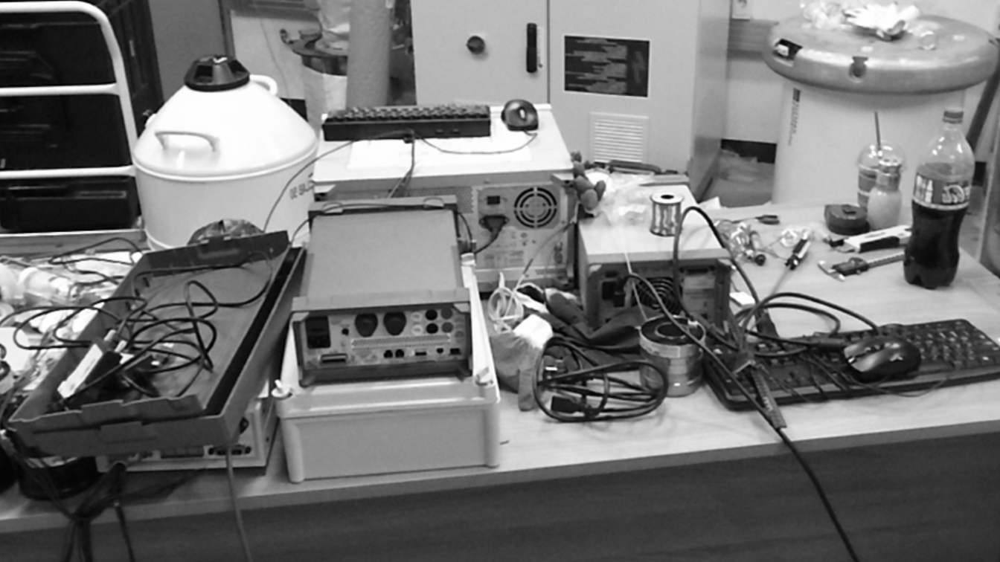

In [ ]:
import cv2
import numpy as np
import time
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

def Estimate_homography(keypoints_1, keypoints_2, matches):
    """Matches를 기반으로 Homography 추정하는 함수"""
    if len(matches) < 4:
        return None

    # src_pts_는 첫번째 이미지의 keypoint 픽셀, dst_pts_는 두번째 이미지의 keypoint 픽셀, 이 좌표들을 통해 첫번째 이미지의 평면을 두번째 이미지의 평면으로 변환
    src_pts_ = np.float32([keypoints_1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts_ = np.float32([keypoints_2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    # Calculate homography matrix using RANSAC
    H_, mask_ = cv2.findHomography(src_pts_, dst_pts_, cv2.RANSAC, 3.0)
    return H_, mask_, src_pts_, dst_pts_


def Apply_Homography(keypoints, H):
    #Apply the Homography matrix to the given keypoints.

    # Convert keypoints to homogeneous coordinates
    pts = np.float32([kp.pt for kp in keypoints]).reshape(-1, 1, 2)

    # Apply the Homography matrix
    transformed_pts = cv2.perspectiveTransform(pts, H)

    return transformed_pts[:, 0, :]

def Apply_Inverse_Homography(keypoints, H):
    """Apply the inverse Homography matrix to the given keypoints."""
    # Compute inverse of Homography matrix
    H_inv = np.linalg.inv(H)

    # Convert keypoints to homogeneous coordinates
    pts = np.float32([kp.pt for kp in keypoints]).reshape(-1, 1, 2)

    # Apply the inverse Homography matrix
    transformed_pts = cv2.perspectiveTransform(pts, H_inv)

    return transformed_pts[:, 0, :]


def Calculate_Repeatability_Homography(keypoints_1, keypoints_2, H, distance_threshold=3.0):
    """Reference(keypoints_1)와 Test Keypoints(keypoints_2) 간 repeatability 계산 (Inverse Homography 적용)"""
    if len(keypoints_1) == 0 or len(keypoints_2) == 0:
        return 0.0

    # Test image의 keypoints를 Reference image 좌표계로 변환
    transformed_pts2 = Apply_Inverse_Homography(keypoints_2, H)
    pts1 = np.float32([kp.pt for kp in keypoints_1])

    repeatable_points = 0

    # Check for repeatable points using transformed test keypoints
    for pt2 in transformed_pts2:
        distances = np.linalg.norm(pts1 - pt2, axis=1)
        if np.min(distances) < distance_threshold:
            repeatable_points += 1

    repeatability = (repeatable_points / len(pts1)) * 100
    return repeatability


def Calculate_scale_space_Repeatability_Homography(keypoints_1, keypoints_2, H, distance_threshold=3.0):
    """Scale space를 고려한 Repeatability 계산 (Inverse Homography 적용)"""
    if len(keypoints_1) == 0 or len(keypoints_2) == 0:
        return 0.0

    ss_repeatable_points = 0

    # Test image의 keypoints를 Reference image 좌표계로 변환
    transformed_pts2 = Apply_Inverse_Homography(keypoints_2, H)

    for idx, kp2 in enumerate(keypoints_2):
        pt2 = transformed_pts2[idx]
        size2 = kp2.size

        for kp1 in keypoints_1:
            pt1 = np.array(kp1.pt)
            size1 = kp1.size

            spatial_dist = np.linalg.norm(pt1 - pt2)
            scale_ratio = min(size1, size2) / max(size1, size2)

            if spatial_dist < distance_threshold and scale_ratio > 0.8:
                ss_repeatable_points += 1
                break

    ss_repeatability = (ss_repeatable_points / len(keypoints_2)) * 100
    return ss_repeatability


def Calculate_metrics_Homography(keypoints_1, keypoints_2, matches, H, reference_img, test_img, detection_time, matching_time, distance_threshold=3.0):
    """Homography 기반 Evaluation metric 계산 (Inverse Homography 적용)"""
    if H is None:
        H, _, _, _ = Estimate_homography(keypoints_1, keypoints_2, matches)

    # Matches Percentage 계산
    total_possible_matches = min(len(keypoints_1), len(keypoints_2))
    matches_percentage = (len(matches) / total_possible_matches) * 100

    # Test image의 matched keypoints를 Reference image 좌표계로 변환
    test_points = np.float32([keypoints_2[m.trainIdx].pt for m in matches])
    transformed_test_points = Apply_Inverse_Homography([keypoints_2[m.trainIdx] for m in matches], H)
    reference_points = np.float32([keypoints_1[m.queryIdx].pt for m in matches])

    # Correct Matches calculation based on transformed points
    point_distances = np.linalg.norm(transformed_test_points - reference_points, axis=1)
    correct_matches = point_distances < distance_threshold
    correct_matches_count = np.sum(correct_matches)

    # Precision, Recall, and F1 Score
    precision = (correct_matches_count / len(matches)) * 100 if len(matches) > 0 else 0
    recall = (correct_matches_count / len(keypoints_1)) * 100 if len(keypoints_1) > 0 else 0
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    # Average localization error
    avg_localization_error = np.mean(point_distances) if len(point_distances) > 0 else float('inf')

    # Repeatability calculations
    repeatability = Calculate_Repeatability_Homography(keypoints_1, keypoints_2, H, distance_threshold)
    ss_repeatability = Calculate_scale_space_Repeatability_Homography(keypoints_1, keypoints_2, H, distance_threshold)

    # Combine metrics
    metrics = {
        'num_keypoints_reference': len(keypoints_1),
        'num_keypoints_test': len(keypoints_2),
        'num_matches': len(matches),
        'matches_percentage': matches_percentage,
        'correct_matches_percentage(precision)': precision,
        'num_correct_matches': correct_matches_count,
        'recall': recall,
        'f1_score': f1_score,
        'avg_localization_error': avg_localization_error,
        'repeatability': repeatability,
        'scale_space_repeatability': ss_repeatability,
        'detection_time_ms': detection_time * 1000,
        'matching_time_ms': matching_time * 1000,
        'total_processing_time': (detection_time + matching_time) * 1000
    }

    return metrics, correct_matches, H


def Visualize_metrics_Homography(reference_img, test_img, keypoints_1, keypoints_2, matches, correct_matches, metrics, H):
    """Evaluation metrics 시각화 (Inverse Homography 적용)"""
    plt.figure(figsize=(20, 12))

    # Plot 1: All matches
    plt.subplot(2, 2, 1)
    matched_img = cv2.drawMatches(reference_img, keypoints_1, test_img, keypoints_2, matches, None, flags=2)
    plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
    plt.title('All Matches')

    # Plot 2: Correct matches only
    correct_matches_list = [m for i, m in enumerate(matches) if correct_matches[i]]
    plt.subplot(2, 2, 2)
    good_matched_img = cv2.drawMatches(reference_img, keypoints_1, test_img, keypoints_2, correct_matches_list, None, flags=2)
    plt.imshow(cv2.cvtColor(good_matched_img, cv2.COLOR_BGR2RGB))
    plt.title('Correct Matches')

    # Plot 3: Performance metrics
    plt.subplot(2, 2, 3)
    metric_names = ['correct_matches_percentage(precision)', 'recall', 'f1_score', 'repeatability', 'scale_space_repeatability']
    metric_values = [metrics[name] for name in metric_names]
    plt.bar(metric_names, metric_values)
    plt.title('Performance Metrics')
    plt.xticks(rotation=45)

    # Plot 4: Keypoint distribution with inverse Homography-transformed keypoints
    plt.subplot(2, 2, 4)
    # Test image의 모든 keypoints를 Reference image 좌표계로 변환
    transformed_keypoints_2 = Apply_Inverse_Homography(keypoints_2, H)

    plt.imshow(cv2.cvtColor(reference_img, cv2.COLOR_BGR2RGB))
    plt.scatter([kp.pt[0] for kp in keypoints_1], [kp.pt[1] for kp in keypoints_1],
                c='g', s=20, alpha=0.5, label='Reference Keypoints')
    plt.scatter([pt[0] for pt in transformed_keypoints_2], [pt[1] for pt in transformed_keypoints_2],
                c='b', s=20, alpha=0.5, label='Transformed Test Keypoints')
    plt.legend()
    plt.title('Keypoint Distribution in Reference Image Space')

    plt.tight_layout()
    plt.show()

def Print_metrics(metrics):
    """결과 출력"""
    print("\nFeature Detection and Matching Evaluation:")
    print("="*50)

    print("\nFeature Detection Metrics:")
    print(f"Number of keypoints (Reference): {metrics['num_keypoints_reference']}")
    print(f"Number of keypoints (Test): {metrics['num_keypoints_test']}")
    print(f"Detection time: {metrics['detection_time_ms']:.2f} ms")

    print("\nMatching Metrics:")
    print(f"Total matches: {metrics['num_matches']}")
    print(f"Matches percentage: {metrics['matches_percentage']:.2f}%")
    print(f"Matching time: {metrics['matching_time_ms']:.2f} ms")

    print("\nPerformance Metrics:")
    print(f"Correct matches count: {metrics['num_correct_matches']}")
    print(f"Correct Matches percentage: {metrics['correct_matches_percentage(precision)']:.2f}%")
    print(f"Recall: {metrics['recall']:.2f}%")
    print(f"F1 Score: {metrics['f1_score']:.2f}%")
    print(f"Average localization error: {metrics['avg_localization_error']:.2f} pixels")
    print(f"Repeatability: {metrics['repeatability']:.2f}%")
    print(f"Scale-space repeatability: {metrics['scale_space_repeatability']:.2f}%")
    print(f"Total processing time: {metrics['total_processing_time']:.2f} ms")
    print("="*50)
    print("\n")

"""================================================================================================================="""

#image 설정
img1 = cv2.imread('lab_2_c.png', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('lab_2_c.png', cv2.IMREAD_GRAYSCALE)


#Ground Truth Homography 입력(알고 있을 경우에만, Homography(기하학적 변화)가 없다면 H를 [[1,0,0],[0,1,0],[0,0,1]]로 입력, 아예 모른다면 H를 None으로 입력)
GTH = None
#GTH = np.array([[1,0,0],[0,1,0],[0,0,1]])
#GTH = np.array([[888.936371179244e-003,18.2514352297355e-003,8.97590117321321e+000],[4.65426880548969e-003,921.643538138129e-003,7.37848417972965e+000],[11.5540704210687e-006,71.2845423476733e-006,1.00068189116337e+000]])

#Brute Force Matcher
def BFMatcher_SIFT(img1, img2, keypoints_1, keypoints_2, descriptors_1, descriptors_2):

  #Brute Force Matcher 사용(SIFT에서)
  bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

  #BF를 활용해서 matching 진행
  start_match = time.time()
  matches = bf.match(descriptors_1, descriptors_2)
  end_match = time.time()

  match_result = sorted(matches, key = lambda x:x.distance)
  matched_img = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, match_result, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

  return descriptors_1, descriptors_2, match_result, matched_img, start_match, end_match

#Brute Force Matcher at binary
def BFMatcher_bi(img1, img2, keypoints_1, keypoints_2, descriptors_1, descriptors_2):

  #Brute Force Matcher 사용(SIFT에서)
  bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

  #BF를 활용해서 matching 진행
  start_match = time.time()
  matches = bf.match(descriptors_1, descriptors_2)
  end_match = time.time()

  match_result = sorted(matches, key = lambda x:x.distance)
  matched_img = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, match_result, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

  return descriptors_1, descriptors_2, match_result, matched_img, start_match, end_match


import cv2
import numpy as np

def scale_and_crop(img, scale_factor):
    # Get original image dimensions
    original_height, original_width = img.shape

    # Calculate new dimensions
    new_height = int(original_height * scale_factor)
    new_width = int(original_width * scale_factor)

    # Scale up the image
    scaled_img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_LINEAR)

    # Calculate crop coordinates to return to original size
    start_y = (new_height - original_height) // 2
    start_x = (new_width - original_width) // 2

    # Crop back to original size
    cropped_img = scaled_img[start_y:start_y+original_height,
                              start_x:start_x+original_width]

    return cropped_img

# Example usage
img1 = cv2.imread('lab_2_c.png', cv2.IMREAD_GRAYSCALE)
scale = 1.5


scaled_img = scale_and_crop(img1, scale)
#cv2.imwrite('scaled_cropped_image.png', scaled_img)
cv2_imshow(scaled_img)

In [ ]:
import numpy as np
import cv2

def calculate_homography_4points(src_points, dst_points):
    """
    Calculate homography matrix from 4 point correspondences.

    Args:
        src_points: List of 4 source points [(x1,y1), (x2,y2), (x3,y3), (x4,y4)]
        dst_points: List of 4 destination points [(x1,y1), (x2,y2), (x3,y3), (x4,y4)]

    Returns:
        homography_matrix: 3x3 homography matrix
    """
    # Convert points to numpy arrays
    src_points = np.float32(src_points)
    dst_points = np.float32(dst_points)

    # Calculate homography matrix
    homography_matrix, status = cv2.findHomography(src_points, dst_points)

    return homography_matrix

def get_GTH(img, scale):
    s = scale

    original_width, original_height= img.shape

    dst_points = [
        [0, 0],     # top-left
        [original_height, 0],   # top-right
        [original_height, original_width], # bottom-right
        [0, original_width]    # bottom-left
    ]

    # Define corresponding points in destination image
    src_points = [
        [(s-1)/(2*s) * original_height, (s-1)/(2*s) * original_width],     # top-left
        [(s+1)/(2*s) * original_height, (s-1)/(2*s) * original_width],    # top-right
        [(s+1)/(2*s) * original_height, (s+1)/(2*s) * original_width],   # bottom-right
        [(s-1)/(2*s) * original_height, (s+1)/(2*s) * original_width]     # bottom-left
    ]

    # Calculate homography
    H = calculate_homography_4points(src_points, dst_points)
    print("Homography matrix:")
    print(H)
    return H

In [ ]:
!rm /content/debug.txt
!rm /content/debug2.txt


Use Depth


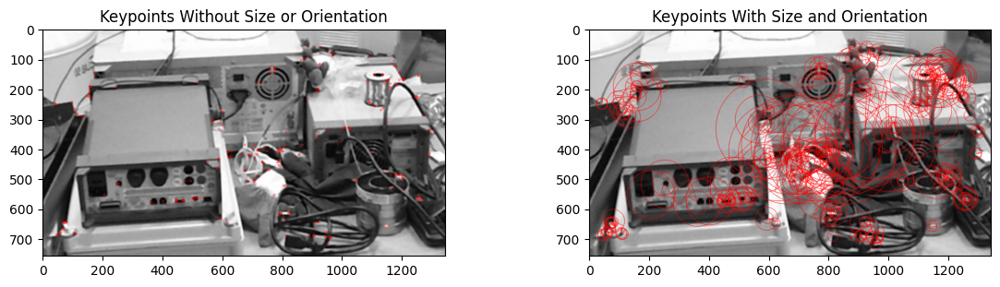


Number of keypoints Detected:  279

Without depth


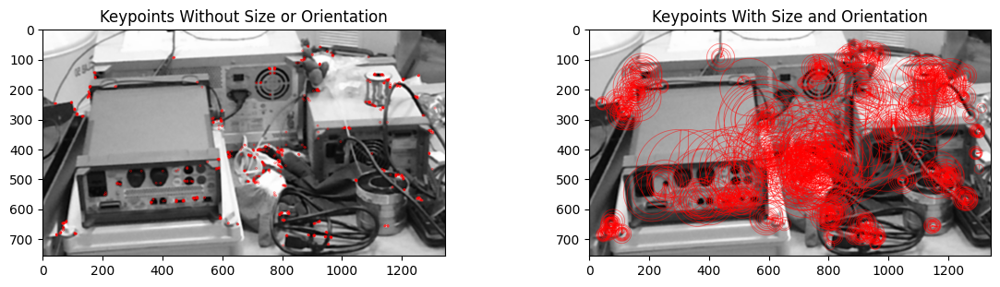


Number of keypoints Detected:  974


In [ ]:
import cv2
import matplotlib.pyplot as plt
import copy

# Load the image
image = cv2.imread('lab_2_c.png')
img1 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
depth = cv2.imread('lab_2_depth_filled.png', cv2.IMREAD_GRAYSCALE)

img1 = cv2.imread('lab_2_c.png', cv2.IMREAD_GRAYSCALE)
depth1 = cv2.imread('lab_2_depth_filled.png', cv2.IMREAD_GRAYSCALE)
scale = 3
img1 = scale_and_crop(img1, scale)
depth = scale_and_crop(depth1, scale)/scale



orb =  cv2.ORB_create(
    nfeatures=1000,           # 특징점의 최대 개수
    scaleFactor=1.2,         # 이미지 크기 축소 비율
    nlevels=16,               # 피라미드 레벨 수
    edgeThreshold=31,        # 경계에서 떨어진 거리
    firstLevel=0,            # 피라미드의 첫 번째 레벨
    WTA_K=2,                 # 비교할 BRIEF 패턴 개수
    scoreType=cv2.ORB_HARRIS_SCORE,  # 점수 방법 (HARRIS_SCORE 또는 FAST_SCORE)
    patchSize=31,            # 특징점 패치 크기
    fastThreshold=20         # FAST 검출기 임계값
)

#depth = np.full_like(depth, 0.0)
keypoints, descriptor = orb.detectAndCompute(img1, depth, None)

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
keyp_without_size = copy.copy(img1)
keyp_with_size = copy.copy(img1)

cv2.drawKeypoints(img1, keypoints, keyp_without_size, color = (255, 0, 0))
cv2.drawKeypoints(img1, keypoints, keyp_with_size,  color = (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)



plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Display the image with the keypoints without size or orientation
print("\nUse Depth")
plt.subplot(221)
plt.title('Keypoints Without Size or Orientation')
plt.imshow(keyp_without_size)

# Display the image with the keypoints with size and orientation
plt.subplot(222)
plt.title('Keypoints With Size and Orientation')
plt.imshow(keyp_with_size)
plt.show()

# Print the number of keypoints detected
print("\nNumber of keypoints Detected: ", len(keypoints))

import cv2
import matplotlib.pyplot as plt
import copy

# Load the image

depth = np.full_like(depth, 0.0)
keypoints, descriptor = orb.detectAndCompute(img1, depth, None)

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
keyp_without_size = copy.copy(img1)
keyp_with_size = copy.copy(img1)

cv2.drawKeypoints(img1, keypoints, keyp_without_size, color = (255, 0, 0))
cv2.drawKeypoints(img1, keypoints, keyp_with_size,  color = (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)



plt.rcParams['figure.figsize'] = [14.0, 7.0]

print("\nWithout depth")
# Display the image with the keypoints without size or orientation
plt.subplot(223)
plt.title('Keypoints Without Size or Orientation')
plt.imshow(keyp_without_size)

# Display the image with the keypoints with size and orientation
plt.subplot(224)
plt.title('Keypoints With Size and Orientation')
plt.imshow(keyp_with_size)
plt.show()

# Print the number of keypoints detected
print("\nNumber of keypoints Detected: ", len(keypoints))

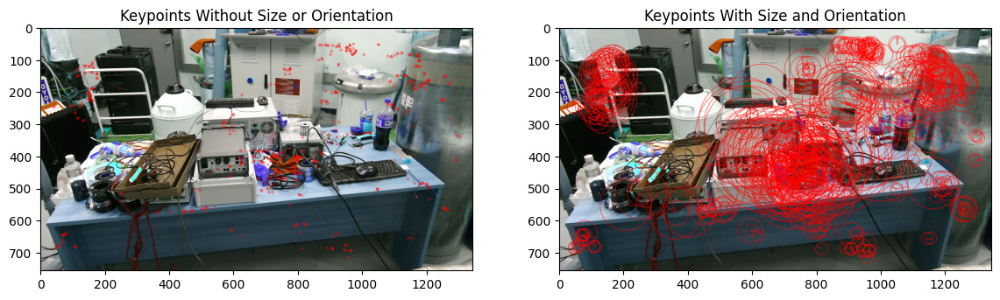


Number of keypoints Detected:  503


In [ ]:
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
keyp_without_size = copy.copy(img1)
keyp_with_size = copy.copy(img1)

cv2.drawKeypoints(img1, keypoints, keyp_without_size, color = (255, 0, 0))
cv2.drawKeypoints(img1, keypoints, keyp_with_size,  color = (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)



plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Display the image with the keypoints without size or orientation
plt.subplot(121)
plt.title('Keypoints Without Size or Orientation')
plt.imshow(keyp_without_size)

# Display the image with the keypoints with size and orientation
plt.subplot(122)
plt.title('Keypoints With Size and Orientation')
plt.imshow(keyp_with_size)
plt.show()

# Print the number of keypoints detected
print("\nNumber of keypoints Detected: ", len(keypoints))

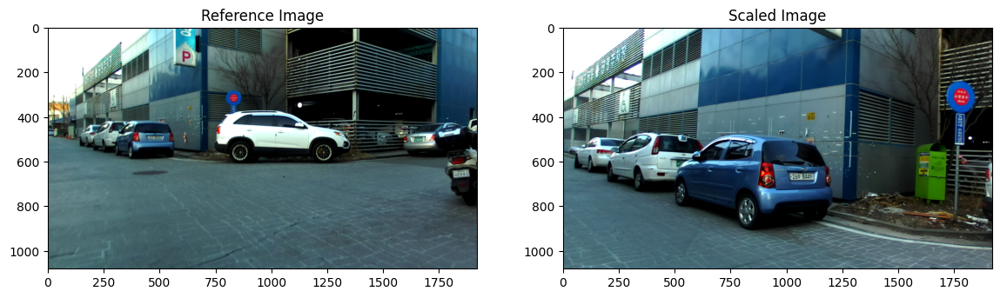

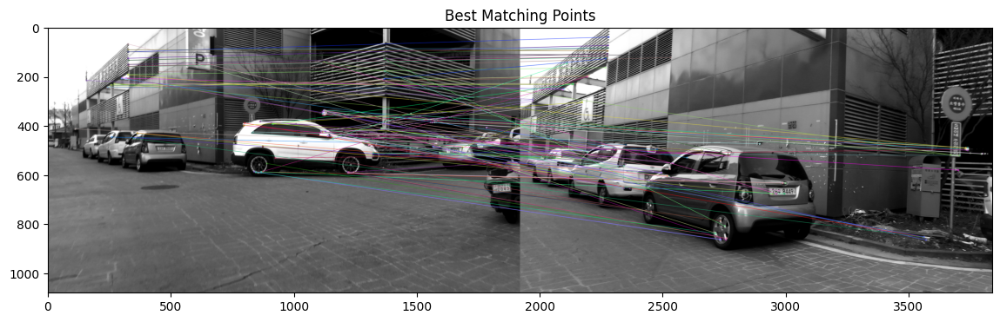

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  500

Number of Matching Keypoints Between The Training and Query Images:  124


In [ ]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('0287.png')
depth1 = cv2.imread('0287_depth.png')

# Load the query image
image2 = cv2.imread('0288.png')
depth2 = cv2.imread('0288_depth.png')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the training and query images
plt.subplot(121)
plt.title('Reference Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Scaled Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)

# Convert the query image to gray scale
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

# Set the parameters of the ORB algorithm by specifying the maximum number of keypoints to locate and
# the pyramid decimation ratio
orb = cv2.ORB_create(
        nfeatures=500,
        scaleFactor=1.2,
        nlevels=8,
        edgeThreshold=31,
        firstLevel=0,
        WTA_K=2,
        patchSize=31
    )

# Find the keypoints in the gray scale training and query images and compute their ORB descriptor.
# The None parameter is needed to indicate that we are not using a mask in either case.
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, depth1, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, depth2, None)

# Create a Brute Force Matcher object. Set crossCheck to True so that the BFMatcher will only return consistent
# pairs. Such technique usually produces best results with minimal number of outliers when there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones we want. So, we sort the matches according to distance


matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with their best matching keypoints in the query image.
# The best matches correspond to the first elements in the sorted matches list, since they are the ones
# with the shorter distance. We draw the first 300 mathces and use flags = 2 to plot the matching keypoints
# without size or orientation.
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:300], query_gray, flags = 2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

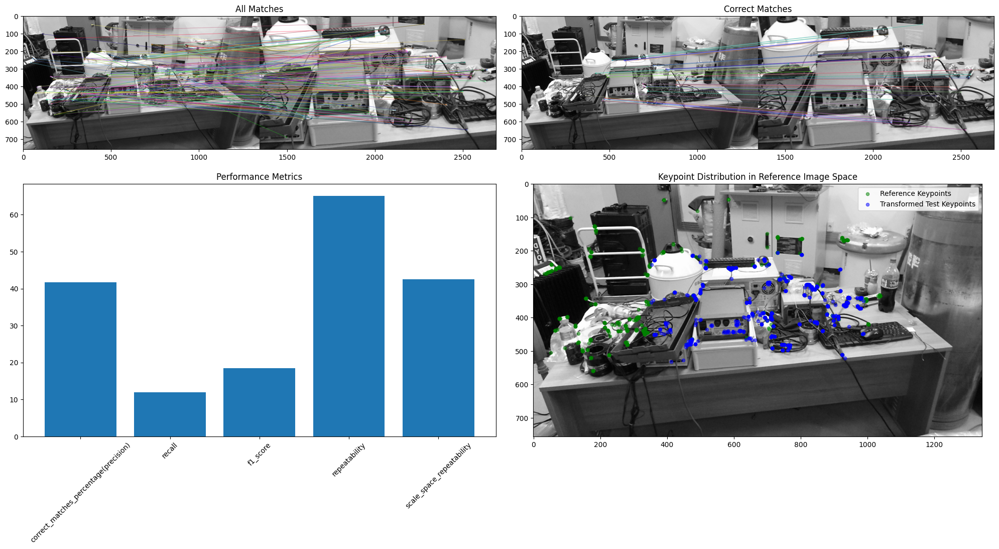


Feature Detection and Matching Evaluation:

Feature Detection Metrics:
Number of keypoints (Reference): 639
Number of keypoints (Test): 705
Detection time: 3302.68 ms

Matching Metrics:
Total matches: 182
Matches percentage: 28.48%
Matching time: 162.23 ms

Performance Metrics:
Correct matches count: 76
Correct Matches percentage: 41.76%
Recall: 11.89%
F1 Score: 18.51%
Average localization error: 227.55 pixels
Repeatability: 65.10%
Scale-space repeatability: 42.55%
Total processing time: 3464.91 ms


[[ 2.00000944e+00 -2.79051043e-03 -6.71423809e+02]
 [ 1.63836418e-03  1.99762939e+00 -3.78208252e+02]
 [ 1.42893554e-06 -4.46762835e-06  1.00000000e+00]]


In [ ]:
import cv2
import time
from google.colab.patches import cv2_imshow

img1 = cv2.imread('lab_2_c.png', cv2.IMREAD_GRAYSCALE)
depth1 = cv2.imread('lab_2_depth_filled.png', cv2.IMREAD_GRAYSCALE)
scale = 2
img2 = scale_and_crop(img1, scale)
depth2 = scale_and_crop(depth1, scale)/scale

#img2 = scaled_up_img
# 이미지가 제대로 로드되지 않은 경우 처리
if img1 is None or img2 is None:
    print("Could not open or find the images!")
    exit()


orb = None
# ORB 특징점 검출기 생성
orb = cv2.ORB_create(
    nfeatures=1000,           # 특징점의 최대 개수
    scaleFactor=1.1,         # 이미지 크기 축소 비율
    nlevels=16,               # 피라미드 레벨 수
    edgeThreshold=31,        # 경계에서 떨어진 거리
    firstLevel=0,            # 피라미드의 첫 번째 레벨
    WTA_K=2,                 # 비교할 BRIEF 패턴 개수
    scoreType=cv2.ORB_HARRIS_SCORE,  # 점수 방법 (HARRIS_SCORE 또는 FAST_SCORE)
    patchSize=31,            # 특징점 패치 크기
    fastThreshold=20         # FAST 검출기 임계값
)


# 특징점과 디스크립터 추출
start = time.time()
keypoints_1, descriptors_1 = orb.detectAndCompute(img1, depth1, None)
keypoints_2, descriptors_2 = orb.detectAndCompute(img2, depth2, None)
end = time.time()


descriptors_1, descriptors_2, match_result, matched_img, start_match, end_match = BFMatcher_bi(img1, img2, keypoints_1, keypoints_2, descriptors_1, descriptors_2)


print("="*50)
GTH = get_GTH(img1, scale)
metrics, correct_matches, CH = Calculate_metrics_Homography(keypoints_1, keypoints_2, match_result, GTH, img1, img2, (end - start), (end_match - start_match))
Visualize_metrics_Homography(img1, img2, keypoints_1, keypoints_2, match_result, correct_matches, metrics, CH)
Print_metrics(metrics)
print(CH)
# d min = 1.0

Homography matrix:
[[   2.    0. -672.]
 [   0.    2. -378.]
 [   0.    0.    1.]]


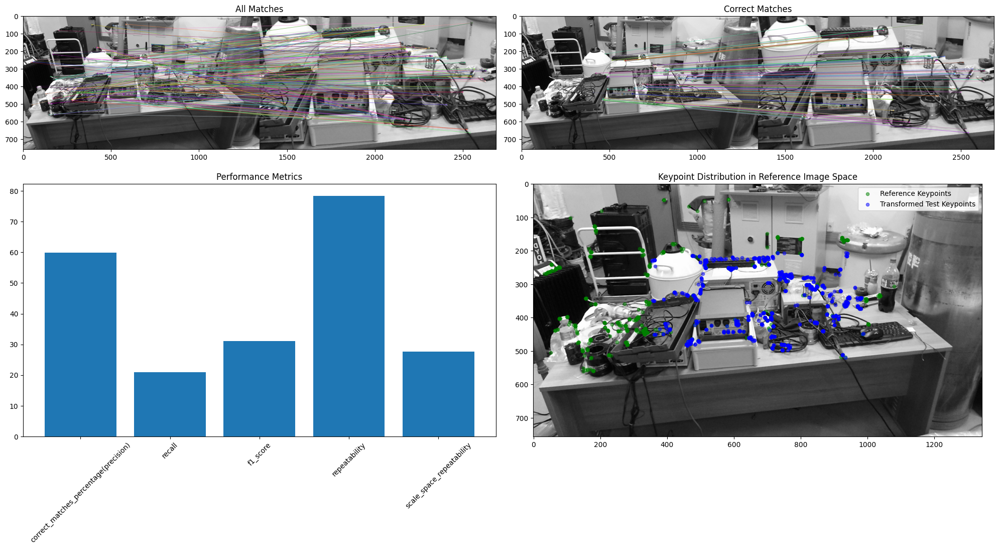


Feature Detection and Matching Evaluation:

Feature Detection Metrics:
Number of keypoints (Reference): 705
Number of keypoints (Test): 888
Detection time: 4364.86 ms

Matching Metrics:
Total matches: 247
Matches percentage: 35.04%
Matching time: 440.31 ms

Performance Metrics:
Correct matches count: 148
Correct Matches percentage: 59.92%
Recall: 20.99%
F1 Score: 31.09%
Average localization error: 157.10 pixels
Repeatability: 78.44%
Scale-space repeatability: 27.59%
Total processing time: 4805.18 ms


[[   2.    0. -672.]
 [   0.    2. -378.]
 [   0.    0.    1.]]


In [ ]:
import cv2
import time
from google.colab.patches import cv2_imshow

img1 = cv2.imread('lab_2_c.png', cv2.IMREAD_GRAYSCALE)
depth1 = cv2.imread('lab_2_depth_filled.png', cv2.IMREAD_GRAYSCALE)

scale = 2
img2 = scale_and_crop(img1, scale)
depth2 = scale_and_crop(depth1, scale)/scale

if img1 is None or img2 is None:
    print("Could not open or find the images!")
    exit()


orb = None
orb = cv2.ORB_create(
    nfeatures=1000,           # 특징점의 최대 개수
    scaleFactor=1.1,         # 이미지 크기 축소 비율
    nlevels=16,               # 피라미드 레벨 수
    edgeThreshold=31,        # 경계에서 떨어진 거리
    firstLevel=0,            # 피라미드의 첫 번째 레벨
    WTA_K=2,                 # 비교할 BRIEF 패턴 개수
    scoreType=cv2.ORB_HARRIS_SCORE,  # 점수 방법 (HARRIS_SCORE 또는 FAST_SCORE)
    patchSize=31,            # 특징점 패치 크기
    fastThreshold=20         # FAST 검출기 임계값
)

# 특징점과 디스크립터 추출
start = time.time()
keypoints_1, descriptors_1 = orb.detectAndCompute(img1, depth1, None)
keypoints_2, descriptors_2 = orb.detectAndCompute(img2, depth2, None)
end = time.time()

descriptors_1, descriptors_2, match_result, matched_img, start_match, end_match = BFMatcher_bi(img1, img2, keypoints_1, keypoints_2, descriptors_1, descriptors_2)

print("="*50)
GTH = get_GTH(img1, scale)
metrics, correct_matches, CH = Calculate_metrics_Homography(keypoints_1, keypoints_2, match_result, GTH, img1, img2, (end - start), (end_match - start_match))
Visualize_metrics_Homography(img1, img2, keypoints_1, keypoints_2, match_result, correct_matches, metrics, CH)
Print_metrics(metrics)
print(CH)
# d min = 2.0

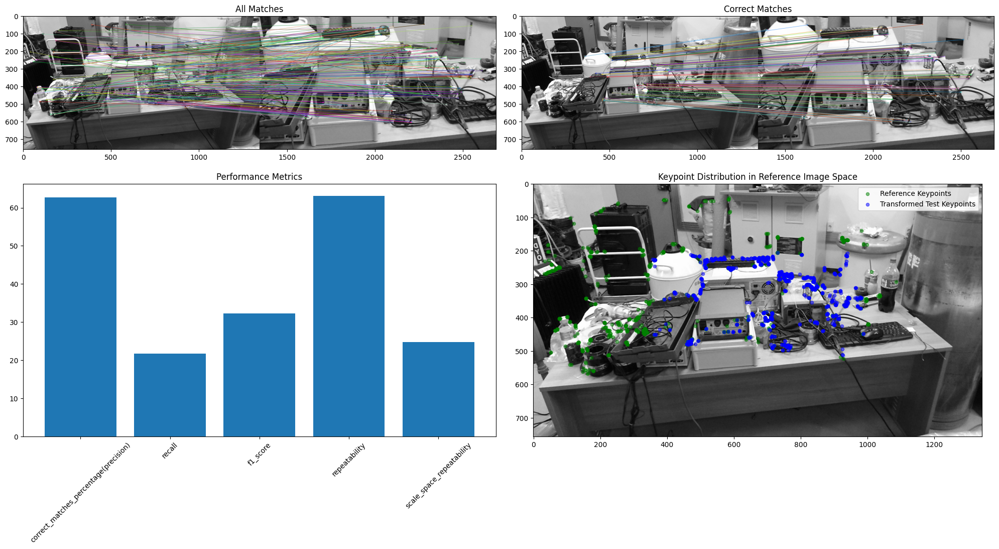


Feature Detection and Matching Evaluation:

Feature Detection Metrics:
Number of keypoints (Reference): 819
Number of keypoints (Test): 864
Detection time: 4343.61 ms

Matching Metrics:
Total matches: 284
Matches percentage: 34.68%
Matching time: 441.66 ms

Performance Metrics:
Correct matches count: 178
Correct Matches percentage: 62.68%
Recall: 21.73%
F1 Score: 32.28%
Average localization error: 165.89 pixels
Repeatability: 63.13%
Scale-space repeatability: 24.77%
Total processing time: 4785.27 ms


[[ 2.00151202e+00 -2.57729363e-04 -6.72652795e+02]
 [ 7.80497458e-04  2.00336294e+00 -3.79142140e+02]
 [-1.57477961e-07  3.44580678e-06  1.00000000e+00]]


In [ ]:
import cv2
import time
from google.colab.patches import cv2_imshow

img1 = cv2.imread('lab_2_c.png', cv2.IMREAD_GRAYSCALE)
depth1 = cv2.imread('lab_2_depth_filled.png', cv2.IMREAD_GRAYSCALE)
scale = 2
img2 = scale_and_crop(img1, scale)
depth2 = scale_and_crop(depth1, scale)/scale

#img2 = scaled_up_img
# 이미지가 제대로 로드되지 않은 경우 처리
if img1 is None or img2 is None:
    print("Could not open or find the images!")
    exit()


orb = None
# ORB 특징점 검출기 생성
orb = cv2.ORB_create(
    nfeatures=1000,           # 특징점의 최대 개수
    scaleFactor=1.1,         # 이미지 크기 축소 비율
    nlevels=16,               # 피라미드 레벨 수
    edgeThreshold=31,        # 경계에서 떨어진 거리
    firstLevel=0,            # 피라미드의 첫 번째 레벨
    WTA_K=2,                 # 비교할 BRIEF 패턴 개수
    scoreType=cv2.ORB_HARRIS_SCORE,  # 점수 방법 (HARRIS_SCORE 또는 FAST_SCORE)
    patchSize=31,            # 특징점 패치 크기
    fastThreshold=20         # FAST 검출기 임계값
)


# 특징점과 디스크립터 추출
start = time.time()
keypoints_1, descriptors_1 = orb.detectAndCompute(img1, depth1, None)
keypoints_2, descriptors_2 = orb.detectAndCompute(img2, depth2, None)
end = time.time()


descriptors_1, descriptors_2, match_result, matched_img, start_match, end_match = BFMatcher_bi(img1, img2, keypoints_1, keypoints_2, descriptors_1, descriptors_2)


print("="*50)
GTH = get_GTH(img1, scale)
metrics, correct_matches, CH = Calculate_metrics_Homography(keypoints_1, keypoints_2, match_result, GTH, img1, img2, (end - start), (end_match - start_match))
Visualize_metrics_Homography(img1, img2, keypoints_1, keypoints_2, match_result, correct_matches, metrics, CH)
Print_metrics(metrics)
print(CH)
# d min = 3.0

Homography matrix:
[[   2.    0. -672.]
 [   0.    2. -378.]
 [   0.    0.    1.]]


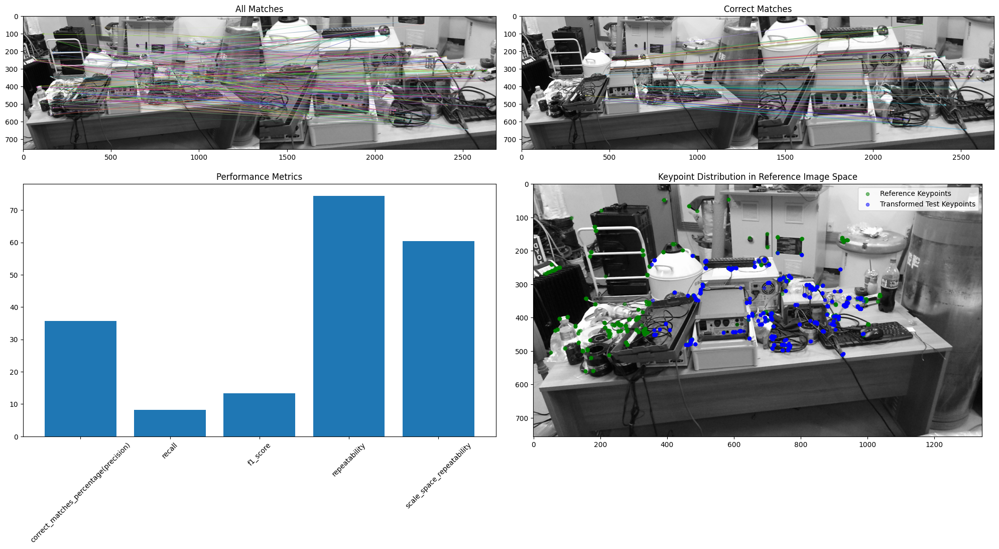


Feature Detection and Matching Evaluation:

Feature Detection Metrics:
Number of keypoints (Reference): 1000
Number of keypoints (Test): 1000
Detection time: 4108.44 ms

Matching Metrics:
Total matches: 230
Matches percentage: 23.00%
Matching time: 664.28 ms

Performance Metrics:
Correct matches count: 82
Correct Matches percentage: 35.65%
Recall: 8.20%
F1 Score: 13.33%
Average localization error: 258.59 pixels
Repeatability: 74.40%
Scale-space repeatability: 60.40%
Total processing time: 4772.72 ms


[[   2.    0. -672.]
 [   0.    2. -378.]
 [   0.    0.    1.]]


In [ ]:
import cv2
import time
from google.colab.patches import cv2_imshow

img1 = cv2.imread('lab_2_c.png', cv2.IMREAD_GRAYSCALE)
depth1 = cv2.imread('lab_2_depth_filled.png', cv2.IMREAD_GRAYSCALE)
scale = 2
img2 = scale_and_crop(img1, scale)
depth2 = scale_and_crop(depth1, scale)/scale

#img2 = scaled_up_img
# 이미지가 제대로 로드되지 않은 경우 처리
if img1 is None or img2 is None:
    print("Could not open or find the images!")
    exit()


orb1 = None
orb2 = None
# ORB 특징점 검출기 생성
orb = cv2.ORB_create(
    nfeatures=1000,           # 특징점의 최대 개수
    scaleFactor=1.1,         # 이미지 크기 축소 비율
    nlevels=8,               # 피라미드 레벨 수
    edgeThreshold=31,        # 경계에서 떨어진 거리
    firstLevel=0,            # 피라미드의 첫 번째 레벨
    WTA_K=2,                 # 비교할 BRIEF 패턴 개수
    scoreType=cv2.ORB_HARRIS_SCORE,  # 점수 방법 (HARRIS_SCORE 또는 FAST_SCORE)
    patchSize=31,            # 특징점 패치 크기
    fastThreshold=20         # FAST 검출기 임계값
)


# 특징점과 디스크립터 추출
start = time.time()
depth1 = np.full_like(depth1, 0.0)
depth2 = np.full_like(depth2, 0.0)
keypoints_1, descriptors_1 = orb.detectAndCompute(img1, depth1, None)
keypoints_2, descriptors_2 = orb.detectAndCompute(img2, depth2, None)
end = time.time()


descriptors_1, descriptors_2, match_result, matched_img, start_match, end_match = BFMatcher_bi(img1, img2, keypoints_1, keypoints_2, descriptors_1, descriptors_2)


print("="*50)
GTH = get_GTH(img1, scale)
metrics, correct_matches, CH = Calculate_metrics_Homography(keypoints_1, keypoints_2, match_result, GTH, img1, img2, (end - start), (end_match - start_match))
Visualize_metrics_Homography(img1, img2, keypoints_1, keypoints_2, match_result, correct_matches, metrics, CH)
Print_metrics(metrics)
print(CH)

Homography matrix:
[[ 3.50e+00  0.00e+00 -1.68e+03]
 [ 0.00e+00  3.50e+00 -9.45e+02]
 [ 0.00e+00  0.00e+00  1.00e+00]]


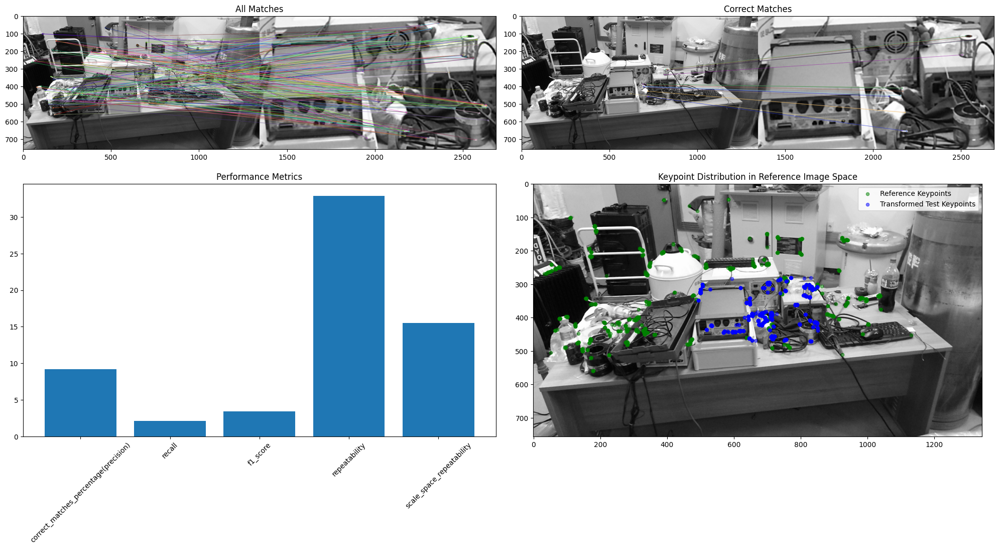


Feature Detection and Matching Evaluation:

Feature Detection Metrics:
Number of keypoints (Reference): 1000
Number of keypoints (Test): 1000
Detection time: 4239.46 ms

Matching Metrics:
Total matches: 228
Matches percentage: 22.80%
Matching time: 356.98 ms

Performance Metrics:
Correct matches count: 21
Correct Matches percentage: 9.21%
Recall: 2.10%
F1 Score: 3.42%
Average localization error: 322.89 pixels
Repeatability: 32.90%
Scale-space repeatability: 15.50%
Total processing time: 4596.44 ms


[[ 3.50e+00  0.00e+00 -1.68e+03]
 [ 0.00e+00  3.50e+00 -9.45e+02]
 [ 0.00e+00  0.00e+00  1.00e+00]]


In [ ]:
import cv2
import time
from google.colab.patches import cv2_imshow

img1 = cv2.imread('lab_2_c.png', cv2.IMREAD_GRAYSCALE)
depth1 = cv2.imread('lab_2_depth_filled.png', cv2.IMREAD_GRAYSCALE)
scale = 3.5
img2 = scale_and_crop(img1, scale)
depth2 = scale_and_crop(depth1, scale)/scale

#img2 = scaled_up_img
# 이미지가 제대로 로드되지 않은 경우 처리
if img1 is None or img2 is None:
    print("Could not open or find the images!")
    exit()


orb1 = None
orb2 = None
# ORB 특징점 검출기 생성
orb = cv2.ORB_create(
    nfeatures=1000,           # 특징점의 최대 개수
    scaleFactor=1.1,         # 이미지 크기 축소 비율
    nlevels=16,               # 피라미드 레벨 수
    edgeThreshold=31,        # 경계에서 떨어진 거리
    firstLevel=0,            # 피라미드의 첫 번째 레벨
    WTA_K=2,                 # 비교할 BRIEF 패턴 개수
    scoreType=cv2.ORB_HARRIS_SCORE,  # 점수 방법 (HARRIS_SCORE 또는 FAST_SCORE)
    patchSize=31,            # 특징점 패치 크기
    fastThreshold=20         # FAST 검출기 임계값
)


# 특징점과 디스크립터 추출
start = time.time()
depth1 = np.full_like(depth1, 0.0)
depth2 = np.full_like(depth2, 0.0)
keypoints_1, descriptors_1 = orb.detectAndCompute(img1, depth1, None)
keypoints_2, descriptors_2 = orb.detectAndCompute(img2, depth2, None)
end = time.time()


descriptors_1, descriptors_2, match_result, matched_img, start_match, end_match = BFMatcher_bi(img1, img2, keypoints_1, keypoints_2, descriptors_1, descriptors_2)


print("="*50)
GTH = get_GTH(img1, scale)
metrics, correct_matches, CH = Calculate_metrics_Homography(keypoints_1, keypoints_2, match_result, GTH, img1, img2, (end - start), (end_match - start_match))
Visualize_metrics_Homography(img1, img2, keypoints_1, keypoints_2, match_result, correct_matches, metrics, CH)
Print_metrics(metrics)
print(CH)

Homography matrix:
[[ 2.50000011e+00  0.00000000e+00 -1.00800008e+03]
 [ 0.00000000e+00  2.49999992e+00 -5.66999990e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


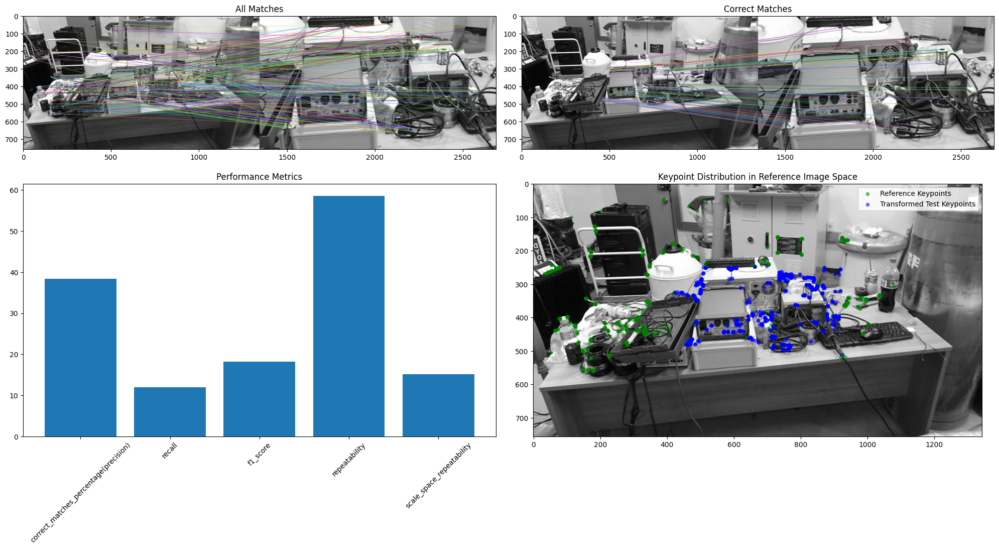


Feature Detection and Matching Evaluation:

Feature Detection Metrics:
Number of keypoints (Reference): 705
Number of keypoints (Test): 773
Detection time: 4622.63 ms

Matching Metrics:
Total matches: 219
Matches percentage: 31.06%
Matching time: 197.07 ms

Performance Metrics:
Correct matches count: 84
Correct Matches percentage: 38.36%
Recall: 11.91%
F1 Score: 18.18%
Average localization error: 237.56 pixels
Repeatability: 58.58%
Scale-space repeatability: 15.14%
Total processing time: 4819.70 ms


[[ 2.50000011e+00  0.00000000e+00 -1.00800008e+03]
 [ 0.00000000e+00  2.49999992e+00 -5.66999990e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [ ]:
import cv2
import time
from google.colab.patches import cv2_imshow

img1 = cv2.imread('lab_2_c.png', cv2.IMREAD_GRAYSCALE)
depth1 = cv2.imread('lab_2_depth_filled.png', cv2.IMREAD_GRAYSCALE)
scale = 2.5
img2 = scale_and_crop(img1, scale)
depth2 = scale_and_crop(depth1, scale)/scale

#img2 = scaled_up_img
# 이미지가 제대로 로드되지 않은 경우 처리
if img1 is None or img2 is None:
    print("Could not open or find the images!")
    exit()


orb = None
# ORB 특징점 검출기 생성
orb = cv2.ORB_create(
    nfeatures=1000,           # 특징점의 최대 개수
    scaleFactor=1.1,         # 이미지 크기 축소 비율
    nlevels=16,               # 피라미드 레벨 수
    edgeThreshold=31,        # 경계에서 떨어진 거리
    firstLevel=0,            # 피라미드의 첫 번째 레벨
    WTA_K=2,                 # 비교할 BRIEF 패턴 개수
    scoreType=cv2.ORB_HARRIS_SCORE,  # 점수 방법 (HARRIS_SCORE 또는 FAST_SCORE)
    patchSize=31,            # 특징점 패치 크기
    fastThreshold=20         # FAST 검출기 임계값
)


# 특징점과 디스크립터 추출
start = time.time()
keypoints_1, descriptors_1 = orb.detectAndCompute(img1, depth1, None)
keypoints_2, descriptors_2 = orb.detectAndCompute(img2, depth2, None)
end = time.time()


descriptors_1, descriptors_2, match_result, matched_img, start_match, end_match = BFMatcher_bi(img1, img2, keypoints_1, keypoints_2, descriptors_1, descriptors_2)


print("="*50)
GTH = get_GTH(img1, scale)
metrics, correct_matches, CH = Calculate_metrics_Homography(keypoints_1, keypoints_2, match_result, GTH, img1, img2, (end - start), (end_match - start_match))
Visualize_metrics_Homography(img1, img2, keypoints_1, keypoints_2, match_result, correct_matches, metrics, CH)
Print_metrics(metrics)
print(CH)
# d min = 2.0

Homography matrix:
[[ 3.000e+00  0.000e+00 -1.344e+03]
 [ 0.000e+00  3.000e+00 -7.560e+02]
 [ 0.000e+00  0.000e+00  1.000e+00]]


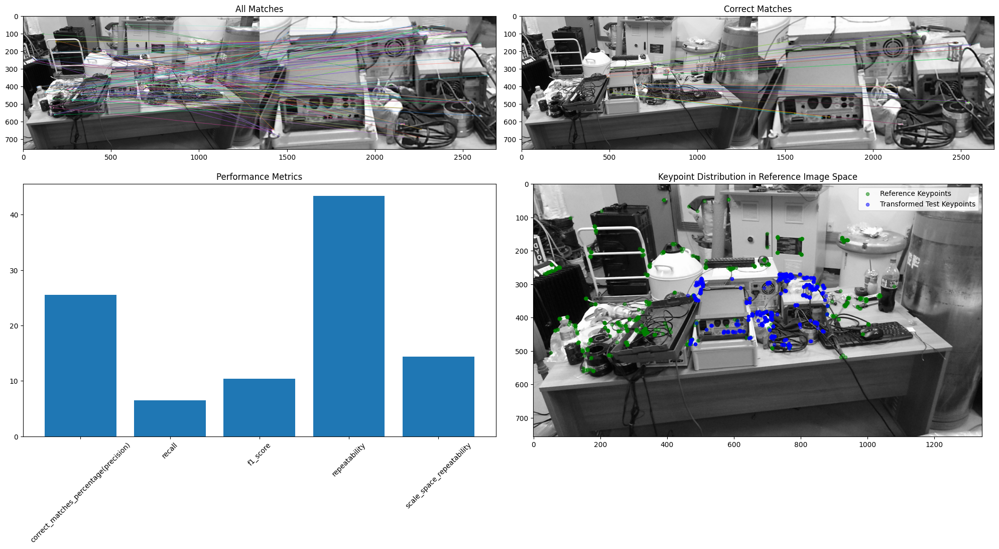


Feature Detection and Matching Evaluation:

Feature Detection Metrics:
Number of keypoints (Reference): 705
Number of keypoints (Test): 654
Detection time: 3336.74 ms

Matching Metrics:
Total matches: 180
Matches percentage: 27.52%
Matching time: 179.58 ms

Performance Metrics:
Correct matches count: 46
Correct Matches percentage: 25.56%
Recall: 6.52%
F1 Score: 10.40%
Average localization error: 273.21 pixels
Repeatability: 43.40%
Scale-space repeatability: 14.37%
Total processing time: 3516.31 ms


[[ 3.000e+00  0.000e+00 -1.344e+03]
 [ 0.000e+00  3.000e+00 -7.560e+02]
 [ 0.000e+00  0.000e+00  1.000e+00]]


In [ ]:
import cv2
import time
from google.colab.patches import cv2_imshow

img1 = cv2.imread('lab_2_c.png', cv2.IMREAD_GRAYSCALE)
depth1 = cv2.imread('lab_2_depth_filled.png', cv2.IMREAD_GRAYSCALE)
scale = 3
img2 = scale_and_crop(img1, scale)
depth2 = scale_and_crop(depth1, scale)/scale

#img2 = scaled_up_img
# 이미지가 제대로 로드되지 않은 경우 처리
if img1 is None or img2 is None:
    print("Could not open or find the images!")
    exit()


orb = None
# ORB 특징점 검출기 생성
orb = cv2.ORB_create(
    nfeatures=1000,           # 특징점의 최대 개수
    scaleFactor=1.1,         # 이미지 크기 축소 비율
    nlevels=16,               # 피라미드 레벨 수
    edgeThreshold=31,        # 경계에서 떨어진 거리
    firstLevel=0,            # 피라미드의 첫 번째 레벨
    WTA_K=2,                 # 비교할 BRIEF 패턴 개수
    scoreType=cv2.ORB_HARRIS_SCORE,  # 점수 방법 (HARRIS_SCORE 또는 FAST_SCORE)
    patchSize=31,            # 특징점 패치 크기
    fastThreshold=20         # FAST 검출기 임계값
)


# 특징점과 디스크립터 추출
start = time.time()
keypoints_1, descriptors_1 = orb.detectAndCompute(img1, depth1, None)
keypoints_2, descriptors_2 = orb.detectAndCompute(img2, depth2, None)
end = time.time()


descriptors_1, descriptors_2, match_result, matched_img, start_match, end_match = BFMatcher_bi(img1, img2, keypoints_1, keypoints_2, descriptors_1, descriptors_2)


print("="*50)
GTH = get_GTH(img1, scale)
metrics, correct_matches, CH = Calculate_metrics_Homography(keypoints_1, keypoints_2, match_result, GTH, img1, img2, (end - start), (end_match - start_match))
Visualize_metrics_Homography(img1, img2, keypoints_1, keypoints_2, match_result, correct_matches, metrics, CH)
Print_metrics(metrics)
print(CH)
# d min = 2.0

Homography matrix:
[[ 3.50e+00  0.00e+00 -1.68e+03]
 [ 0.00e+00  3.50e+00 -9.45e+02]
 [ 0.00e+00  0.00e+00  1.00e+00]]


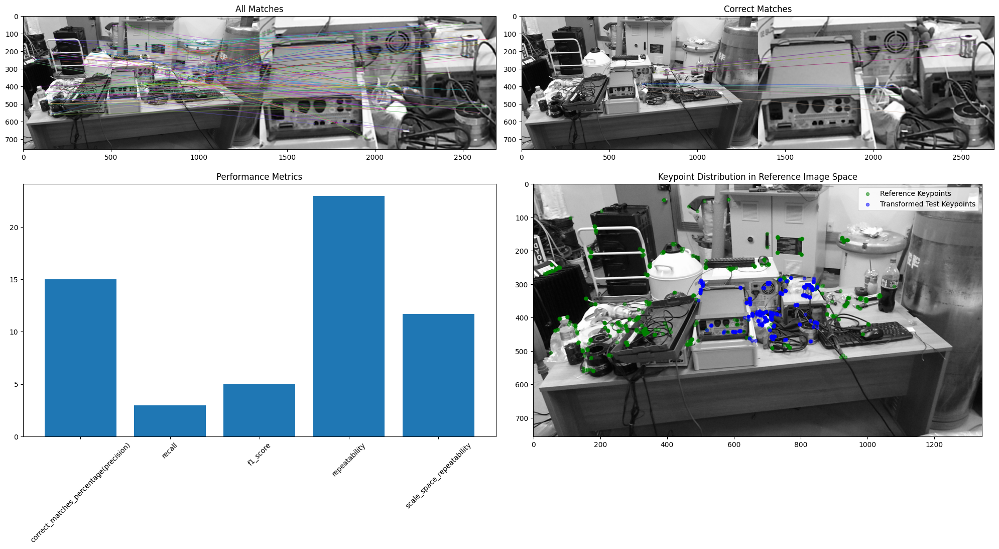


Feature Detection and Matching Evaluation:

Feature Detection Metrics:
Number of keypoints (Reference): 705
Number of keypoints (Test): 419
Detection time: 3290.64 ms

Matching Metrics:
Total matches: 140
Matches percentage: 33.41%
Matching time: 108.17 ms

Performance Metrics:
Correct matches count: 21
Correct Matches percentage: 15.00%
Recall: 2.98%
F1 Score: 4.97%
Average localization error: 306.36 pixels
Repeatability: 22.98%
Scale-space repeatability: 11.69%
Total processing time: 3398.82 ms


[[ 3.50e+00  0.00e+00 -1.68e+03]
 [ 0.00e+00  3.50e+00 -9.45e+02]
 [ 0.00e+00  0.00e+00  1.00e+00]]


In [ ]:
import cv2
import time
from google.colab.patches import cv2_imshow

img1 = cv2.imread('lab_2_c.png', cv2.IMREAD_GRAYSCALE)
depth1 = cv2.imread('lab_2_depth_filled.png', cv2.IMREAD_GRAYSCALE)
scale = 3.5
img2 = scale_and_crop(img1, scale)
depth2 = scale_and_crop(depth1, scale)/scale

#img2 = scaled_up_img
# 이미지가 제대로 로드되지 않은 경우 처리
if img1 is None or img2 is None:
    print("Could not open or find the images!")
    exit()


orb = None
# ORB 특징점 검출기 생성
orb = cv2.ORB_create(
    nfeatures=1000,           # 특징점의 최대 개수
    scaleFactor=1.1,         # 이미지 크기 축소 비율
    nlevels=16,               # 피라미드 레벨 수
    edgeThreshold=31,        # 경계에서 떨어진 거리
    firstLevel=0,            # 피라미드의 첫 번째 레벨
    WTA_K=2,                 # 비교할 BRIEF 패턴 개수
    scoreType=cv2.ORB_HARRIS_SCORE,  # 점수 방법 (HARRIS_SCORE 또는 FAST_SCORE)
    patchSize=31,            # 특징점 패치 크기
    fastThreshold=20         # FAST 검출기 임계값
)


# 특징점과 디스크립터 추출
start = time.time()
keypoints_1, descriptors_1 = orb.detectAndCompute(img1, depth1, None)
keypoints_2, descriptors_2 = orb.detectAndCompute(img2, depth2, None)
end = time.time()


descriptors_1, descriptors_2, match_result, matched_img, start_match, end_match = BFMatcher_bi(img1, img2, keypoints_1, keypoints_2, descriptors_1, descriptors_2)


print("="*50)
GTH = get_GTH(img1, scale)
metrics, correct_matches, CH = Calculate_metrics_Homography(keypoints_1, keypoints_2, match_result, GTH, img1, img2, (end - start), (end_match - start_match))
Visualize_metrics_Homography(img1, img2, keypoints_1, keypoints_2, match_result, correct_matches, metrics, CH)
Print_metrics(metrics)
print(CH)
# d min = 2.0